正在加载模型...

开始预测测试图片...
图片 100669875_p0.jpg => 95.0
图片 100720076_p0.jpg => 95.0
图片 102208248_p0.jpg => 95.0
图片 102257565_p0.jpg => 95.0
图片 102517558_p0.jpg => 95.0
图片 10752019_p0.jpg => 95.0
图片 31404020_p0.jpg => 95.0
图片 40080443_p0.jpg => 48.4
图片 40179800_p0.jpg => 94.5
图片 40761311_p0.jpg => 95.0
图片 42004536_p0.png => 40.0
图片 43203044_p0.jpg => 92.6
图片 43478260_p0.jpg => 95.0
图片 44526375_p0.jpg => 40.2
图片 45090742_p0.jpg => 45.4
图片 4531683_p0.png => 94.9
图片 45547940_p0.jpg => 40.0
图片 46905476_p0.jpg => 40.0
图片 49361111_p0.jpg => 40.1
图片 5137747_p0.jpg => 57.7
图片 57184988_p0.jpg => 40.0
图片 58631790_p0.png => 92.0
图片 59954530_p0.jpg => 64.6
图片 60922957_p0.jpg => 92.8
图片 61335595_p0.jpg => 95.0
图片 62799720_p0.jpg => 95.0
图片 63134299_p0.jpg => 95.0
图片 63323734_p0.jpg => 95.0
图片 64495529_p0.png => 95.0
图片 64686503_p0.jpg => 95.0
图片 65462396_p0.jpg => 95.0
图片 66933557_p0.jpg => 95.0
图片 67752083_p0.jpg => 95.0
图片 70919813_p0.png => 95.0
图片 71377287_p0.jpg => 57.4
图片 71782881_p0.jpg => 40.1
图片

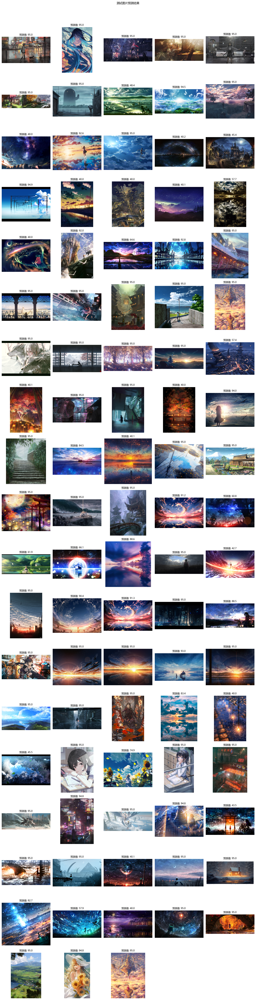

In [4]:
import os
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt

plt.rcParams['font.sans-serif'] = ['Microsoft YaHei']  # 使用黑体（Windows系统自带）
plt.rcParams['axes.unicode_minus'] = False  # 解决负号显示问题
# 1. 加载训练好的模型函数
def load_model(model_path):
    """加载模型结构和权重，返回模型及标签范围"""
    model = models.resnet50()  # 必须与训练时结构一致
    num_ftrs = model.fc.in_features
    model.fc = nn.Sequential(
        nn.Linear(num_ftrs, 1),
        nn.Sigmoid()
    )
    
    # 加载checkpoint
    checkpoint = torch.load(model_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    min_label = checkpoint['label_range'][0]  # 标签最小值
    max_label = checkpoint['label_range'][1]  # 标签最大值
    
    return model, min_label, max_label
# 2. 初始化设置
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # 自动选择设备
model_path = 'model/resnet50_regression.pth'  # 模型保存路径
test_dir = 'test'  # 测试图片文件夹路径
# 3. 加载模型
print("正在加载模型...")
model, min_label, max_label = load_model(model_path)
model = model.to(device)
model.eval()  # 切换到评估模式（关闭dropout等）
# 4. 数据预处理（必须与训练时完全相同！）
transform = transforms.Compose([
    transforms.Resize((224, 224)),      # 调整尺寸
    transforms.ToTensor(),              # 转为Tensor
    transforms.Normalize(               # 归一化参数
        mean=[0.485, 0.456, 0.406],     # ImageNet均值
        std=[0.229, 0.224, 0.225]       # ImageNet标准差
    )
])
# 5. 预测函数（含反归一化）
def predict(image_path):
    """输入图片路径，返回预测值"""
    try:
        # 打开图片并预处理
        image = Image.open(image_path).convert('RGB')  # 强制转为RGB三通道
        image = transform(image).unsqueeze(0).to(device)  # 增加batch维度
        
        # 预测并反归一化
        with torch.no_grad():  # 关闭梯度计算
            normalized_pred = model(image)
            pred_value = normalized_pred.item() * (max_label - min_label) + min_label
        
        return pred_value
    except Exception as e:
        print(f"处理图片 {os.path.basename(image_path)} 时出错: {str(e)}")
        return None
# 6. 获取测试图片列表
import math
# 1. 获取测试图片路径
test_images = [
    os.path.join(test_dir, f) 
    for f in os.listdir(test_dir) 
    if f.lower().endswith(('.png', '.jpg', '.jpeg'))
]  # 不需要限制数量

# 2. 动态计算布局
n = len(test_images)
cols = 5  # 每行最多显示5张
rows = math.ceil(n / cols)  # 自动计算需要的行数

# 3. 创建画布 (根据图片数量动态调整大小)
plt.figure(figsize=(cols*3, rows*3))  # 每列宽度3英寸，每行高度3英寸

print("\n开始预测测试图片...")
for i, img_path in enumerate(test_images):
    pred = predict(img_path)
    if pred is not None:
        # 显示图片和预测结果
        img_display = Image.open(img_path)
        plt.subplot(rows, cols, i+1)  # 使用动态计算的布局
        plt.imshow(img_display)
        plt.title(f"预测值: {pred:.1f}", fontsize=10)  # 调整字体大小
        plt.axis('off')
        print(f"图片 {os.path.basename(img_path)} => {pred:.1f}")

# 4. 优化布局
plt.tight_layout(pad=1.0, h_pad=1.0, w_pad=1.0)  # 增加子图间距
plt.suptitle('测试图片预测结果', y=1.02, fontsize=12)
plt.show()